# RV-Transit Joint Fit (FCO) Example: TOI-2431 b

* Note that in this notebook due to memory issues, I will be working with a subset of the light curve data and won't be using sufficient MCMC steps.
* It is recommended to run this notebook for ~ 60000 MCMC steps with all of the light curve data.

### Brief summary

* We will also be using FCO, which essentially means defining nights of observations as separate instruments to eliminate additional RV signal from potential outer planets in the system.
* In TOI-2431 b's case (see rv-tests, TOI-2431_RVOnlyFit.ipynb), the RV data shows excess scatter meaning that there is something going on in the system.
* We have checked the host star TOI-2431's activity and the rotational modulation, which suggested that the star is quiet and won't be affecting the RV data in a short amount of time.
* This brings us to the potential additional planets in the system alongside TOI-2431 b.
* Our goal with FCO is to eliminate these "RV signals", i.e., excess scatter, from the RV data of TOI-2431 b.

* Since TOI-2431's RV data has 3 nights of observations that are eligible for FCO method, we have defined a Likelihood function inside the ExoMUSE_fit module called LPFunctionRVTransit3Instruments.
* For this reason, we will have to import 3 separate datasets that contain the individual datasets of 3 separate nights.

* Normally, it is also possible to divide the entire RV dataset into different nights using Python.
* However, since our Likelihood Function is defined for 3 instruments (nights), we won't be using that and importing the separate nights as separate datasets instead.
* But, we will be providing the code on how to do so which is as follows:

## Importing ExoMUSE and required libraries

In [146]:
#We first use %matplotlib inline to display the plots in the notebook.
%matplotlib inline

In [147]:
#We then import the required libraries.
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize
from importlib import reload

import corner
import radvel

import os
import sys
import astropy.time

In [148]:
#We then import the ExoMUSE codes.
sys.path.insert(0, '../../ExoMUSE/')
try:
    sys.path.remove('\\wsl.localhost\\Ubuntu\\home\\kayahan')
except Exception as e:
    print(e)

#We import ExoMUSE_fit.py, ExoMUSE_utils.py, and ExoMUSE_gaiasource.py as standards.
import ExoMUSE_fit
import ExoMUSE_utils
import ExoMUSE_gaiasource

reload(ExoMUSE_fit)

ExoMUSE_fit, ExoMUSE_utils, ExoMUSE_gaiasource

list.remove(x): x not in list


(<module 'ExoMUSE_fit' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_fit.py'>,
 <module 'ExoMUSE_utils' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_utils.py'>,
 <module 'ExoMUSE_gaiasource' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_gaiasource.py'>)

In [149]:
#We also import rcParams to keep our plots consistent throughout various notebooks.
from matplotlib import rcParams

#We change the formating of the plots.
rcParams["axes.formatter.useoffset"] = False
rcParams['axes.formatter.limits'] = -15,15
rcParams['mathtext.fontset'] = 'stix'
rcParams['font.family'] = 'STIXGeneral'
rcParams['xtick.direction']='in'
rcParams['ytick.direction']='in'

## Data Input

In [150]:
#We import the datasets.
#Since this is a RV-Transit Joint Fit implementing FCO method we import:
    #RV data from night 1
    #RV data from night 2
    #RV data from night 3
    #Transit Data

#We import separate nights as separate RV datasets.
df_rv1 = pd.read_csv("../../data/rvdata/TOI-2431_RV_data_NEIDA.csv")
df_rv2 = pd.read_csv("../../data/rvdata/TOI-2431_RV_data_NEIDB.csv")
df_rv3 = pd.read_csv("../../data/rvdata/TOI-2431_RV_data_NEIDC.csv")

#We also import the transit data.
df_tr = pd.read_csv("../../data/lcdata/TOI-2431_TESS_LC.csv")

#Since the transit dataset is very large, the run takes a while.
#However, we can reduce the size of the dataset, if needed, by using indexing.
df_tr = df_tr[:]

#We can now combine all of the datasets into a dictionary as an input for the likelihood function.
df = {"time_rv1": df_rv1["bjd"].values,
      "rv1": df_rv1["rv"].values,
      "e_rv1": df_rv1["e_rv"].values,
      "time_rv2": df_rv2["bjd"].values,
      "rv2": df_rv2["rv"].values,
      "e_rv2": df_rv2["e_rv"].values,
      "time_rv3": df_rv3["bjd"].values,
      "rv3": df_rv3["rv"].values,
      "e_rv3": df_rv3["e_rv"].values,
      "time_phot": df_tr["time"].values,
      "flux": df_tr["flux"].values,
      "e_flux": df_tr["flux_err"].values}

df


{'time_rv1': array([2460661.69433389, 2460661.83431901]),
 'rv1': array([-12.67198657, -26.54149916]),
 'e_rv1': array([2.79139421, 3.36937574]),
 'time_rv2': array([2460680.64476996, 2460680.74656597]),
 'rv2': array([-22.9312947,  -2.3428049]),
 'e_rv2': array([4.56335888, 3.0117734 ]),
 'time_rv3': array([2460725.61728925, 2460725.62103128, 2460725.67232209,
        2460725.6758779 ]),
 'rv3': array([ -1.36241563,  -6.29403621, -16.34462272, -11.34680843]),
 'e_rv3': array([2.95723424, 2.70314487, 5.56712605, 5.37577569]),
 'time_phot': array([2459144.52044902, 2459144.52183793, 2459144.52322685, ...,
        2460259.40319537, 2460259.40458422, 2460259.40597308]),
 'flux': array([1.0008868 , 0.99936676, 1.0006325 , ..., 1.0008562 , 1.0007735 ,
        1.0007703 ]),
 'e_flux': array([0.00079696, 0.00079656, 0.00079697, ..., 0.00085897, 0.00086042,
        0.0008615 ])}

## Setting up the Priors 

In [151]:
#We then import the Prior file for the RV-Transit Joint Fit for 3 Instruments (FCO).
f = "../../data/lcrvpriors/TOI2431_PriorsRVLC3Instruments.txt"

reload(ExoMUSE_fit)

<module 'ExoMUSE_fit' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_fit.py'>

## Setting up the Log-Likelihood

In [152]:
#We then use "LPFunctionRVTransit3Instruments" for the Transit-Only Fit.
    #"LPFunction" => Log-Likelihood Function
    #"RVTransit" => RV-Transit Joint Fit
    #"3Instruments" => 3 Instruments (FCO)

#We setup our Log-Likelihood Function by using the dataset and the prior file.
#LPFunctionRVTransit3Instruments takes the dictionary of the datasets that we have defined previously.
#Note that this function prints out the Priors.
L = ExoMUSE_fit.LPFunctionRVTransit3Instruments(df, file_priors = f)

Reading in priorfile from ../../data/lcrvpriors/TOI2431_PriorsRVLC3Instruments.txt
   prior          arg1          arg2        label  description priortype  \
0     NP  2.241950e-01  4.000000e-07         P_p1         P_p1     model   
1     NP  2.460259e+06  4.664000e-04        t0_p1        t0_p1     model   
2     FP  0.000000e+00  0.000000e+00       ecc_p1       ecc_p1     model   
3     FP  9.000000e+01  9.000000e+01     omega_p1     omega_p1     model   
4     UP  0.000000e+00  1.000000e+00         p_p1         p_p1     model   
5     UP  1.000000e+00  5.000000e+00         a_p1         a_p1     model   
6     UP  5.000000e+01  9.000000e+01       inc_p1       inc_p1     model   
7     NP  3.230000e+03  1.800000e+02          rho          rho     model   
8     UP  0.000000e+00  1.000000e+00           u1           u1     model   
9     UP  0.000000e+00  1.000000e+00           u2           u2     model   
10    NP  2.920000e-01  2.600000e-02      tdur_p1      tdur_p1     model   
11   

In [153]:
#We then define a fitting object by using the Log-Likelihood as follows.
TF = ExoMUSE_fit.ExoMUSEfitRVTransit3Instruments(L)

## Setting up the MCMC run

In [ ]:
#For the MCMC, we use pyDE and emcee.
#We use pyDE to find the initial points for the chains.
#We then use emcee.EnsembleSampler to run the MCMC chains.
#This is all done by .minimize_pyDE() function from ExoMUSE_Fit.
    #de_iter => Differential Evolution iterations, used for the distribution of walkers.
        #To distribute better, we increase de_iter.
        #However, this would increase the initial optimization time.
    #mc_iter => MCMC iterations, used for the number of steps in the chains.
        #We can evaluate the chains using GR Statistic and/or Autocorrelation time.
        #Depending on the evaluations, we can increase the mc_iter.
        #However, this will of course increase the time of the MCMC run.

TF.minimize_PyDE(de_iter=200,mc_iter=20000,)

Running PyDE Optimizer


## Flattening the Chains

In [123]:
#We can define the burn-in period to be the first 1000 steps.
#This means that we will discard the first 1000 samples from each chain.
burnin_index = 1000

#We then discard the first 1000 samples from all of the chains as follows.
    #First part: We take all the chains.
    #Second part: We discard the first 1000 samples per chain.
    #Third part: We take all the parameters that were in the MCMC run.
chains_after_burnin = TF.sampler.chain[ : , burnin_index : , : ]

#We then have to reshape the chains to obtain the flatchain as follows.
    #TF.lpf => ExoMUSE_fit.LPFunctionRVTransit3Instruments
    #.ps_vary => The Prior Set of the parameters that vary (from priors.py)
    #.priors => The priors of the varying parameters.
flatchain = chains_after_burnin.reshape((-1, len(TF.lpf.ps_vary.priors)))

In [124]:
#To store the posteriors from the flatchain, we can define a pandas DataFrame.
    #This time TF.lpf.ps_vary.labels takes the name of the varying parameters.
df_post = pd.DataFrame(flatchain, columns = TF.lpf.ps_vary.labels)

df_post

,P_p1,t0_p1,p_p1,a_p1,inc_p1,rho,u1,u2,tdur_p1,K_p1,gamma_rv1,gamma_rv2,gamma_rv3,sigma_tr1
0,0.224195,2.460259e+06,0.015575,1.903504,80.228568,3456.570437,0.307394,0.434448,0.303764,10.546874,-21.244144,-6.427949,-10.131428,0.000013
1,0.224195,2.460259e+06,0.015575,1.903504,80.228568,3456.570437,0.307394,0.434448,0.303764,10.546874,-21.244144,-6.427949,-10.131428,0.000013
2,0.224195,2.460259e+06,0.015575,1.903504,80.228568,3456.570437,0.307394,0.434448,0.303764,10.546874,-21.244144,-6.427949,-10.131428,0.000013
3,0.224195,2.460259e+06,0.015575,1.903504,80.228568,3456.570437,0.307394,0.434448,0.303764,10.546874,-21.244144,-6.427949,-10.131428,0.000013
4,0.224195,2.460259e+06,0.015575,1.903504,80.228568,3456.570437,0.307394,0.434448,0.303764,10.546874,-21.244144,-6.427949,-10.131428,0.000013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,0.224196,2.460259e+06,0.016689,1.481741,60.343200,3153.024570,0.010125,0.110875,0.286500,9.760419,-19.195364,-15.604148,-10.324230,0.000162
299996,0.224196,2.460259e+06,0.016689,1.481741,60.343200,3153.024570,0.010125,0.110875,0.286500,9.760419,-19.195364,-15.604148,-10.324230,0.000162
299997,0.224196,2.460259e+06,0.016689,1.481741,60.343200,3153.024570,0.010125,0.110875,0.286500,9.760419,-19.195364,-15.604148,-10.324230,0.000162
299998,0.224196,2.460259e+06,0.017205,1.488130,60.650166,3151.997471,0.035678,0.139159,0.284039,9.334314,-20.097474,-15.199713,-10.222638,0.000156


## Assessing the Chains

In [125]:
#To check and assess the chains, we can use mcmc_help.
import mcmc_help

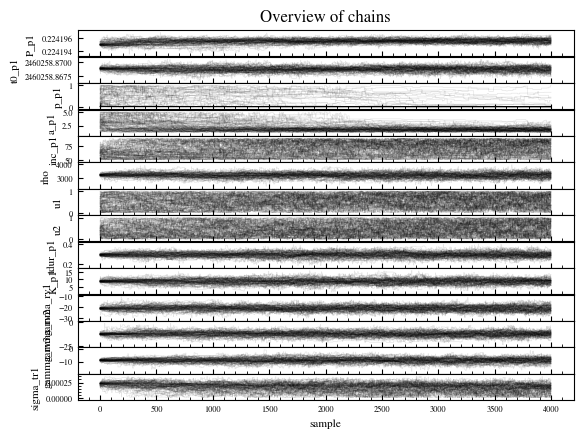

In [126]:
#We use the plot_chains function from the mcmc_help module to plot the chains.
#Note that TF.sampler is equivalent to an emcee.EnsembleSampler object.
mcmc_help.plot_chains(TF.sampler.chain, labels = TF.lpf.ps_vary.labels)

plt.show();

In [127]:
#We can also check the Gelman-Rubin (GR) Statistic to evaluate the chains of each parameter.
#We want the GR statistic to be within 1% of unity => The results should be 1 to 1.01
print("GR Statistics:")
print(50 * "-")
print(mcmc_help.gelman_rubin(chains_after_burnin))
print(50 * "-")

GR Statistics:
--------------------------------------------------
[1.12175432 1.11914921 1.95924437 1.34409313 1.32010049 1.14502689
 1.1362397  1.13311    1.11484776 1.11489705 1.11151364 1.14966668
 1.12634874 1.12501484]
--------------------------------------------------


In [128]:
#We can also check the autocorrelation time of the chains.
#If the chain isn't long enough, we would get the following error:
    #The chain is shorter than 50 times the integrated autocorrelation time for x parameter(s).
    #Use this estimate with caution and run a longer chain: N/50 = 40

try:
    print(50 * "-")
    print("Autocorrelation Time")
    print(50 * "-")
    tau = TF.sampler.get_autocorr_time()
    print(tau)

    #We can also divide the length of the chain by the autocorrelation time to get the number of s
    #independent samples.
    print(50 * "-")
    print("Number of Independent Samples")
    print(50 * "-")
    N_eff = len(flatchain) / tau
    print(N_eff)
    print(50 * "-")
    
except Exception as e:
    print("Error calculating the autocorrelation time:", e)
print(50 * "-")


--------------------------------------------------
Autocorrelation Time
--------------------------------------------------
Error calculating the autocorrelation time: The chain is shorter than 50 times the integrated autocorrelation time for 14 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 80;
tau: [339.66995837 283.76051102 354.15584209 399.23042862 300.4431002
 292.94403226 290.39753296 301.33466105 263.11781775 270.76302267
 233.78904487 271.56736151 260.58122187 294.34588139]
--------------------------------------------------


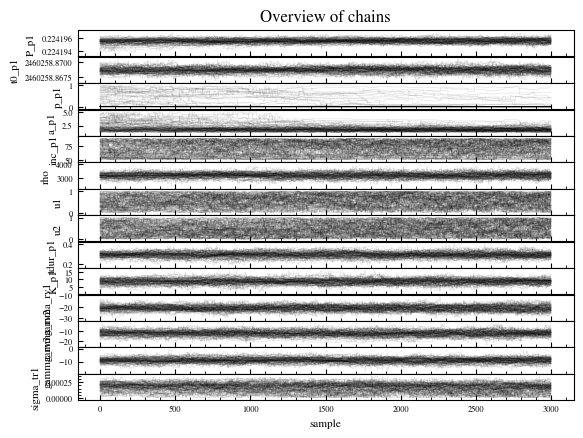

In [129]:
#We can also check how the flatchains look by plotting the flatchains.
mcmc_help.plot_chains(chains_after_burnin, labels = TF.lpf.ps_vary.labels)
plt.show();

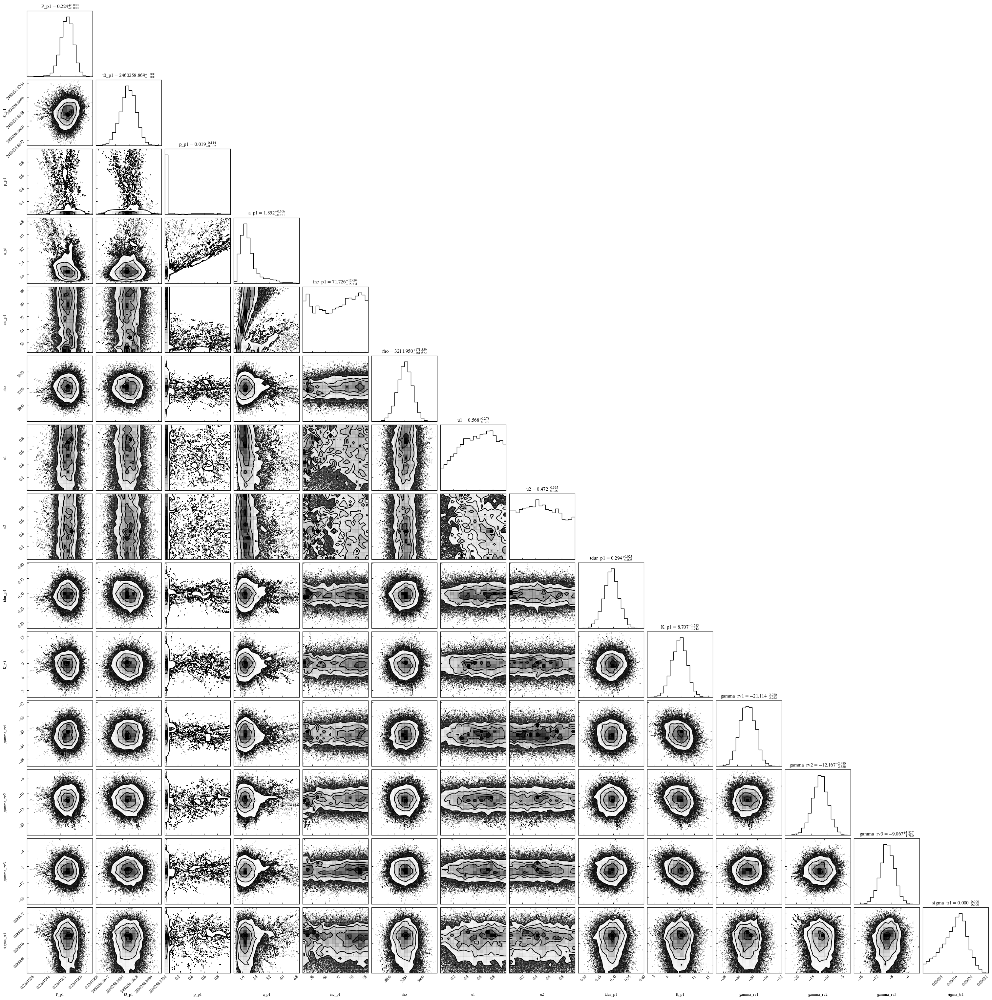

In [130]:
#We can also plot the corner plot to see the correlations and the posterior distributions
#of each parameter that was in the MCMC run.
fig = corner.corner(df_post.iloc[:,:].values,
       show_titles=True,labels=list(df_post.iloc[:,:].columns),title_fmt='.3f',xlabcord=(0.5, -0.2));

plt.show();

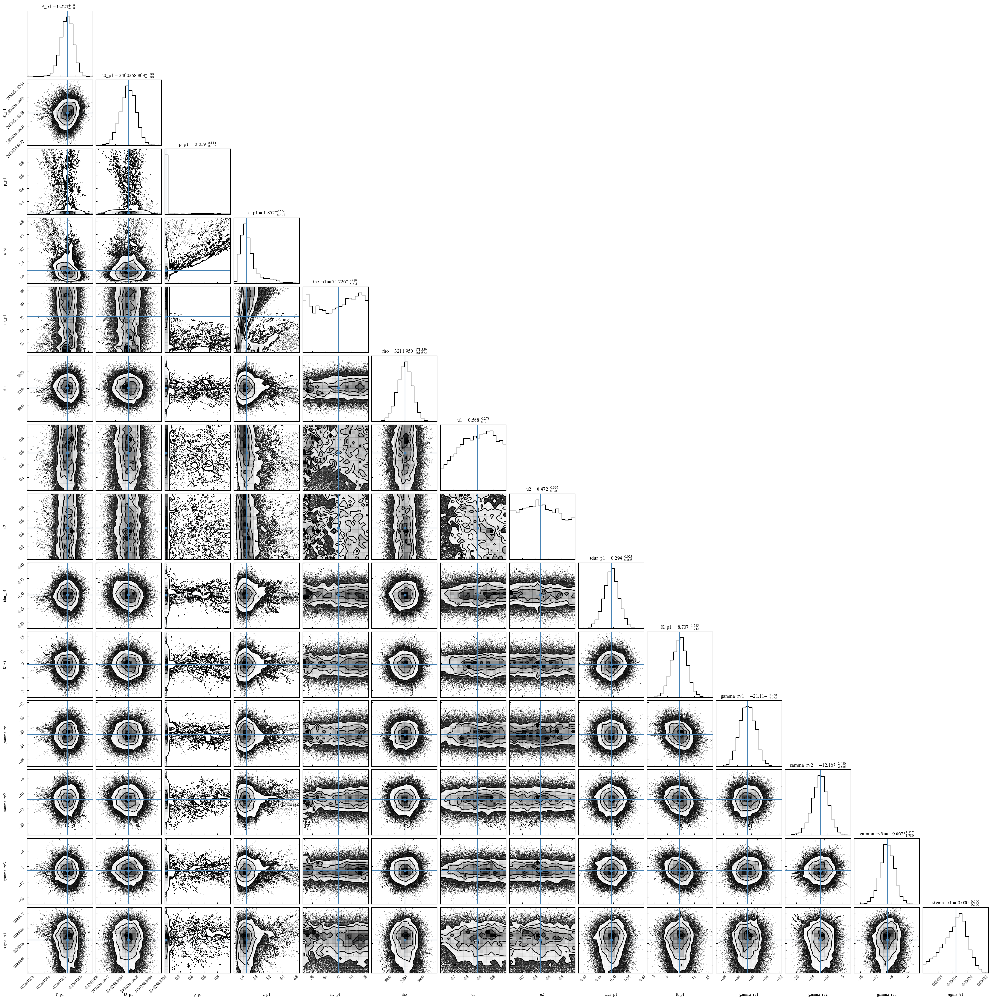

In [ ]:
#We can also plot the corner plot with 50th percentile, i.e., the median to see whether
#the posterior distributions are sampled correctly or not.
#We first find the median of each parameter.
pv_50 = np.percentile(flatchain,[50],axis=0)[0]

#We then plot the corner plot and the median.
corner.corner(df_post.iloc[:, :].values,truths=pv_50,
       show_titles=True,labels=list(df_post.iloc[:, :].columns),title_fmt='.3f',xlabcord=(0.5, -0.2));

plt.show();

## Working with the Posteriors

In [ ]:
#We can obtain the median and uncertainties of each parameter by using the
#.get_mean_values_mcmc_posteriors() function from ExoMUSE_fit.LPFunctionRVTransit3Instruments.
df_medvals = TF.get_mean_values_mcmc_posteriors(df_post.values)

df_medvals

,medvals,minus,plus,values,Labels,Description
0,2.241956e-01,3.211874e-07,3.048582e-07,$0.22419556_{-0.0000003}^{+0.0000003}$,P_p1,P_p1
0,2.460259e+06,4.515531e-04,4.262459e-04,$2460258.86873_{-0.00045}^{+0.00043}$,t0_p1,t0_p1
0,1.881851e-02,2.139826e-03,1.138178e-01,$0.0188_{-0.0021}^{+0.11}$,p_p1,p_p1
0,1.851994e+00,3.211881e-01,5.662236e-01,$1.85_{-0.32}^{+0.57}$,a_p1,a_p1
0,7.172593e+01,1.573073e+01,1.269358e+01,$72.0_{-16.0}^{+13.0}$,inc_p1,inc_p1
0,3.211950e+03,1.816721e+02,1.715585e+02,$3210.0_{-180.0}^{+170.0}$,rho,rho
0,5.683529e-01,3.185227e-01,2.781011e-01,$0.57_{-0.32}^{+0.28}$,u1,u1
0,4.719545e-01,3.089552e-01,3.348179e-01,$0.47_{-0.31}^{+0.33}$,u2,u2
0,2.935627e-01,2.598715e-02,2.500757e-02,$0.294_{-0.026}^{+0.025}$,tdur_p1,tdur_p1
0,8.706856e+00,1.742205e+00,1.584681e+00,$8.7_{-1.7}^{+1.6}$,K_p1,K_p1


In [133]:
df_medvals[["Labels", "values"]]

,Labels,values
0,P_p1,$0.22419556_{-0.0000003}^{+0.0000003}$
0,t0_p1,$2460258.86873_{-0.00045}^{+0.00043}$
0,p_p1,$0.0188_{-0.0021}^{+0.11}$
0,a_p1,$1.85_{-0.32}^{+0.57}$
0,inc_p1,$72.0_{-16.0}^{+13.0}$
0,rho,$3210.0_{-180.0}^{+170.0}$
0,u1,$0.57_{-0.32}^{+0.28}$
0,u2,$0.47_{-0.31}^{+0.33}$
0,tdur_p1,$0.294_{-0.026}^{+0.025}$
0,K_p1,$8.7_{-1.7}^{+1.6}$


## Plotting the Data and the Best-Fit Model

In [134]:
#We first define the Title and the amount of times we will sample the model.
TITLE = "TOI-2431 RV-Transit Joint Fit"
NUM_SAMPLES = 5000

In [ ]:
reload(ExoMUSE_fit)

<module 'ExoMUSE_fit' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_fit.py'>

### Plotting the Data and the Best-Fit Model over Time

#### Working with RV Data

In [ ]:
#We first start with the RV data.

#We can plot the data and the best-fit model over time.
    #Optional: If there we want to convert Julian Dates into Datetimes, i.e. DD-MM-YYYY format,
    #we can use ExoMUSE_utils.jd2datetime(times) function, where times is in Julian Dates.

#For this, we first get the times from our dataset.
times_data_rv1 = TF.lpf.data_rv1["time"]
times_data_rv2 = TF.lpf.data_rv2["time"]
times_data_rv3 = TF.lpf.data_rv3["time"]

#We also define an array to store all the times in one array.
times_data_rv = np.concatenate((times_data_rv1, times_data_rv2, times_data_rv3))

print("Times Data RV1:", times_data_rv1)
print("Times Data RV2:", times_data_rv2)
print("Times Data RV3:", times_data_rv3)
print("Times Data All:", times_data_rv)

Times Data RV1: [2460661.69433389 2460661.83431901]
Times Data RV2: [2460680.64476996 2460680.74656597]
Times Data RV3: [2460725.61728925 2460725.62103128 2460725.67232209 2460725.6758779 ]
Times Data All: [2460661.69433389 2460661.83431901 2460680.64476996 2460680.74656597
 2460725.61728925 2460725.62103128 2460725.67232209 2460725.6758779 ]


In [ ]:
#We first get the medians of the parameters by using the flatchain.
#This again can be obtained by checking the 50th percentile of the flatchains.
pv_50 = np.percentile(flatchain, [50], axis=0)[0]

#We then define the amount of times where we will sample the Best-Fit Model, which is a time range starting from the earliest observation to the latest observation.
times_model_rv = np.linspace(TF.lpf.data_rv1['time'][0]-0.02,TF.lpf.data_rv3['time'][-1]+0.02,5000)

#We then compute the best-fit models for all instruments by using the median values and defined times.
rv_model_rv1, rv_model_rv2, rv_model_rv3 = TF.lpf.compute_rv_model(pv_50, times_model_rv, times_model_rv, times_model_rv)

#We also compute the radial velocity data from the model at the observation times.
rv_data_from_model1, rv_data_from_model2, rv_data_from_model3 = TF.lpf.compute_rv_model(pv_50, times_data_rv1, times_data_rv2, times_data_rv3)

#From here, we can calculate the residuals, i.e., DATA - MODEL
residuals_rv1 = TF.lpf.data_rv1["y"] - rv_data_from_model1
residuals_rv2 = TF.lpf.data_rv2["y"] - rv_data_from_model2
residuals_rv3 = TF.lpf.data_rv3["y"] - rv_data_from_model3

print("Residuals for RV1:", residuals_rv1)
print("Residuals for RV2:", residuals_rv2)
print("Residuals for RV3:", residuals_rv3)

Residuals for RV1: [-0.24756354  0.35824479]
Residuals for RV2: [-2.2826197   1.13370327]
Residuals for RV3: [ 1.79871283 -2.43076668 -1.05069972  4.52168459]


In [138]:
#We can also plot the uncertainty intervals of our RV model.
#For this, we can define the following loop that does:
    #1-) Sample a random vector of parameters from the flatchain. E.g. 200th chain
    #2-) Compute the Transit curve using the sampled parameter set/vector.
    #3-) Add this Transit curve model to a list.
    #4-) Sample from this list to get the uncertainty intervals.

#For this we first define a list to store all of the Transit models.
rv_models_for_uncertainty = []

#We then define the loop that does what we described above.
for i in range(NUM_SAMPLES):
    idx = np.random.randint(0, flatchain.shape[0])
    model = TF.lpf.compute_rv_model(flatchain[idx], times_model_rv, times_model_rv, times_model_rv)
    rv_models_for_uncertainty.append(model)

#We then convert this list to an array.
rv_models_for_uncertainty = np.array(rv_models_for_uncertainty)

#### Working with Transit Data

In [139]:
#We do the same for the Transit data.
#For this, we first get the times from our dataset.
times_data_tr = TF.lpf.data_phot["time"]

print("Times Data Transit:", times_data_tr)

Times Data Transit: [2459144.52044902 2459144.52183793 2459144.52322685 ... 2459147.29965555
 2459147.30104446 2459147.30243336]


In [ ]:
#We first get the medians of the parameters by using the flatchain.
#This again can be obtained by checking the 50th percentile of the flatchains.
pv_50 = np.percentile(flatchain, [50], axis=0)[0]

#We then define the amount of times where we will sample the Best-Fit Model.
times_model_tr = np.linspace(times_data_tr.min(), times_data_tr.max(), NUM_SAMPLES)

#We then compute the best-fit model by using the median values and defined times.
tr_model = TF.lpf.compute_transit_model(pv_50, times_model_tr)

#We also compute the radial velocity data from the model at the observation times.
tr_data_from_model = TF.lpf.compute_transit_model(pv_50, times_data_tr)

#From here, we can calculate the residuals, i.e., DATA - MODEL
residuals_tr = TF.lpf.data_phot["y"] - tr_data_from_model

print("Residuals for Transit:", residuals_tr)

Residuals for Transit: [ 8.86800000e-04 -6.33240000e-04  6.32500000e-04 ... -1.74244150e-04
  2.74748424e-04 -9.70625560e-05]


#### Plotting the RV-Transit Joint Fit

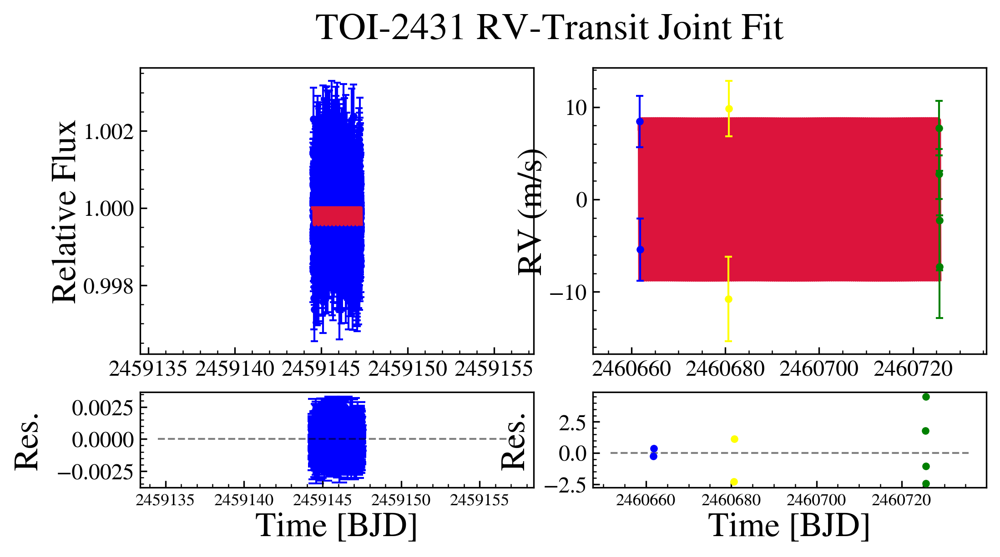

In [141]:
#We then plot our data.
#For this we define 2 rows and columns to show both RV and Transit fit.
    #One of the columns will have two rows: One of them for the Flux and Best-Fit model, other for the residuals.
    #The other column will also have two rows: One of them for the RV and Best-Fit model, other for the residuals. 
fig, ((ax_tr, ax_rv), (bx_tr, bx_rv)) = plt.subplots(dpi=300, nrows=2, ncols=2, gridspec_kw={"height_ratios": [3, 1]}, figsize = (8,4))

################################################################ TRANSIT PLOTTING #################################################################

#We first add the sigma_tr uncertainty to the Transit data.
uncertainty_sigma_tr = df_medvals["medvals"][df_medvals["Labels"] == "sigma_tr1"].values[0]
inflated_tr_err = np.sqrt(pow(TF.lpf.data_phot["error"], 2) + pow(uncertainty_sigma_tr, 2))

#We plot the Transit data.
ax_tr.errorbar(TF.lpf.data_phot["time"], TF.lpf.data_phot["y"], 
               yerr = inflated_tr_err, marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="blue",
               markersize=6, label='Data - TESS', zorder = -100)

#We then plot the best-fit model for the Transit data.
ax_tr.plot(times_model_tr, tr_model, color="crimson", label = "Best-Fit Model", lw=2., zorder=10)

#We then plot the residuals for the Transit data.
bx_tr.errorbar(TF.lpf.data_phot["time"], residuals_tr,
               yerr = inflated_tr_err, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="blue",
               markersize=6, zorder = -100)

#We set the labels and titles for the Transit plot.
ax_tr.set_ylabel('Relative Flux', labelpad=0, fontsize=18)
bx_tr.set_xlabel('Time [BJD]', labelpad=2, fontsize=18)
bx_tr.set_ylabel('Res.', labelpad=6, fontsize=18)

#We get the x limit and then set a new limit.
xlim_tr = (TF.lpf.data_phot["time"].min(), TF.lpf.data_phot["time"].max())
ax_tr.set_xlim(xlim_tr[0]-10, xlim_tr[-1]+10)

#We do the same for y limit.
ylim_tr = ax_tr.get_ylim()
ax_tr.set_ylim(ylim_tr[0] + 0, ylim_tr[-1] + 0)

#We also plot the zero-line for the residuals.
time_res = np.linspace(xlim_tr[0]-10, xlim_tr[-1]+10, 100)
bx_tr.plot(time_res, 0 * np.ones(100), color='black', ls='--', lw=1, alpha=0.5, zorder=-10)

#We set 0.02 horizontal space between 2 rows of plots.
fig.subplots_adjust(hspace=0.02)

################################################################ RV PLOTTING #################################################################

#We first add the sigma_rv uncertainties to the RV datasets.
# uncertainty_sigma_rv1 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv1"].values[0]
# uncertainty_sigma_rv2 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv2"].values[0]
# uncertainty_sigma_rv3 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv3"].values[0]

#This time, the sigma_rv uncertainties were kept fixed.
uncertainty_sigma_rv1 = 0.0
uncertainty_sigma_rv2 = 0.0
uncertainty_sigma_rv3 = 0.0

inflated_rv_err1 = np.sqrt(pow(TF.lpf.data_rv1["error"], 2) + pow(uncertainty_sigma_rv1, 2))
inflated_rv_err2 = np.sqrt(pow(TF.lpf.data_rv2["error"], 2) + pow(uncertainty_sigma_rv2, 2))
inflated_rv_err3 = np.sqrt(pow(TF.lpf.data_rv3["error"], 2) + pow(uncertainty_sigma_rv3, 2))

#We then plot the RV data for each night.
#Note that we need to subtract the systematic velocities from each of the RV points to center them around the zero line.
ax_rv.errorbar(TF.lpf.data_rv1["time"], TF.lpf.data_rv1["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1'), yerr = inflated_rv_err1,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="blue",
               markersize=6, label='Data - NEIDA', zorder = 100)
ax_rv.errorbar(TF.lpf.data_rv2["time"], TF.lpf.data_rv2["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv2'), yerr = inflated_rv_err2,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="yellow",
               markersize=6, label='Data - NEIDB', zorder = 100)
ax_rv.errorbar(TF.lpf.data_rv3["time"], TF.lpf.data_rv3["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv3'), yerr = inflated_rv_err3,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="green",
               markersize=6, label='Data - NEIDC', zorder = 100)

#We then plot the best-fit model for the RV data.
#In here, since we are plotting with the RV model of the first dataset, we remove the systematic velocity of the first dataset to get it centered around the zero line.
ax_rv.plot(times_model_rv, rv_model_rv1-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1'), color="crimson", label = "Best-Fit Model", lw=2., zorder=10)

#We then plot the residuals for the RV data.
bx_rv.errorbar(times_data_rv1, residuals_rv1, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="blue",
               markersize=6, label='Residuals - NEIDA', zorder = 100)
bx_rv.errorbar(times_data_rv2, residuals_rv2, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="yellow",
               markersize=6, label='Residuals - NEIDB', zorder = 100)
bx_rv.errorbar(times_data_rv3, residuals_rv3, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="green",
               markersize=6, label='Residuals - NEIDC', zorder = 100)

#We plot the uncertainty intervals by using rv_models_for_uncertainty.
# #1 Sigma Interval
# ax_rv.fill_between(times_model, 
#                 np.percentile(rv_models_for_uncertainty, 16, axis=0),
#                 np.percentile(rv_models_for_uncertainty, 84, axis=0),
#                 color='#EE2C2C', alpha=0.3)
# #2 Sigma Interval
# ax_rv.fill_between(times_model, 
#                 np.percentile(rv_models_for_uncertainty, 2, axis=0),
#                 np.percentile(rv_models_for_uncertainty, 98, axis=0),
#                 color='#EE2C2C', alpha=0.2)
# #3 Sigma Interval
# ax_rv.fill_between(times_model, 
#                 np.percentile(rv_models_for_uncertainty, 0.15, axis=0),
#                 np.percentile(rv_models_for_uncertainty, 99.85, axis=0),
#                 color='#EE2C2C', alpha=0.1)

#We set the labels and titles for the RV plot.
ax_rv.set_ylabel('RV (m/s)', labelpad=0, fontsize=18)
bx_rv.set_xlabel('Time [BJD]', labelpad=2, fontsize=18)
bx_rv.set_ylabel('Res.', labelpad=6, fontsize=18)

#We get the x limit and then set a new limit.
xlim_rv = (min(TF.lpf.data_rv1["time"].min(), TF.lpf.data_rv2["time"].min(), TF.lpf.data_rv3["time"].min()),
           max(TF.lpf.data_rv1["time"].max(), TF.lpf.data_rv2["time"].max(), TF.lpf.data_rv3["time"].max()))
ax_rv.set_xlim(xlim_rv[0]-10,xlim_rv[1]+10)

#We do the same for y limit.
ylim_rv = ax_rv.get_ylim()
ax_rv.set_ylim(ylim_rv[0]+0, ylim_rv[-1]+0)

#We define additional times to plot the zero-line for residuals.
time_res_rv = np.linspace(xlim_rv[0]-10,xlim_rv[-1]+10,100)
bx_rv.plot(time_res_rv,0*np.ones(100),color='black',ls='--',lw=1,alpha=0.5,zorder=-10)

#We set 0.02 horizontal space between 2 rows of plots.
fig.subplots_adjust(hspace=0.02)

#We apply the settings to the axes.
for xx in [ax_tr, ax_rv, bx_tr, bx_rv]:
    ExoMUSE_utils.ax_apply_settings(xx)
    xx.grid(lw=0)

bx_tr.tick_params(axis = 'x', labelsize = 9)
bx_rv.tick_params(axis = 'x', labelsize = 9)

fig.suptitle(TITLE, fontsize=20)

fig.subplots_adjust(hspace=0.2, wspace=0.15)

plt.show();

### Plotting the Data and the Best-Fit Model over Phase

In [142]:
#To plot the Data and the Best-Fit model over Phase, we first need to get the Period and T0
#from the flatchains.
P = df_medvals["medvals"][df_medvals["Labels"] == "P_p1"].values[0]
T_0 = df_medvals["medvals"][df_medvals["Labels"] == "t0_p1"].values[0]

#We can then use ExoMUSE_utils.time_to_phase(times, P, T0) function to convert the times
#to phase.
phase_data_rv1 = ExoMUSE_utils.time_to_phase(times_data_rv1, P, T_0, phase_method="normal")
phase_data_rv2 = ExoMUSE_utils.time_to_phase(times_data_rv2, P, T_0, phase_method="normal")
phase_data_rv3 = ExoMUSE_utils.time_to_phase(times_data_rv3, P, T_0, phase_method="normal")
phase_data_tr = ExoMUSE_utils.time_to_phase(times_data_tr, P, T_0, phase_method="centered")

#We then convert the model times to phase too.
phase_model_rv = ExoMUSE_utils.time_to_phase(times_model_rv, P, T_0, phase_method="normal")
phase_model_tr = ExoMUSE_utils.time_to_phase(times_model_tr, P, T_0, phase_method="centered")

#We then have to sort the data according to the Phase values we have.
sorted_indices_rv = np.argsort(phase_model_rv)
phase_model_sorted_rv = phase_model_rv[sorted_indices_rv]
rv_model_sorted = rv_model_rv1[sorted_indices_rv]

sorted_indices_tr = np.argsort(phase_model_tr)
phase_model_sorted_tr = phase_model_tr[sorted_indices_tr]
tr_model_sorted = tr_model[sorted_indices_tr]


In [143]:
#We can again the uncertainty intervals of our model.
#It is the same structure as before.

#For this we first define a list to store all of the Transit models.
rv_models_for_uncertainty_phase = []

#We then define the loop that does what we described above.
for i in range(NUM_SAMPLES):
    idx = np.random.randint(0, flatchain.shape[0])
    model = TF.lpf.compute_rv_model(flatchain[idx], times_model_rv, times_model_rv, times_model_rv)
    model_sorted = model[0][sorted_indices_rv]
    rv_models_for_uncertainty_phase.append(model_sorted)

#We then convert this list to an array.
rv_models_for_uncertainty_phase = np.array(rv_models_for_uncertainty_phase)

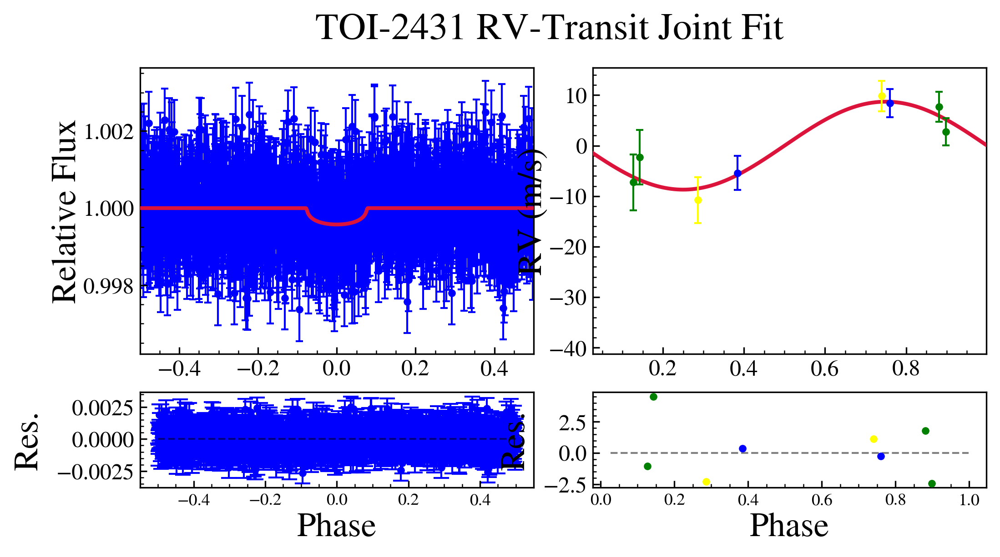

In [144]:
#We then plot our data.
#For this we define 2 rows and columns to show both RV and Transit fit.
    #One of the columns will have two rows: One of them for the Flux and Best-Fit model, other for the residuals.
    #The other column will also have two rows: One of them for the RV and Best-Fit model, other for the residuals. 
fig, ((ax_tr, ax_rv), (bx_tr, bx_rv)) = plt.subplots(dpi=300, nrows=2, ncols=2, gridspec_kw={"height_ratios": [3, 1]}, figsize = (8,4))

################################################################ TRANSIT PLOTTING #################################################################

#We first add the sigma_tr uncertainty to the Transit data.
uncertainty_sigma_tr = df_medvals["medvals"][df_medvals["Labels"] == "sigma_tr1"].values[0]
inflated_tr_err = np.sqrt(pow(TF.lpf.data_phot["error"], 2) + pow(uncertainty_sigma_tr, 2))

#We plot the Transit data.
ax_tr.errorbar(phase_data_tr, TF.lpf.data_phot["y"], 
               yerr = inflated_tr_err, marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="blue",
               markersize=6, label='Data - TESS', zorder = -100)

#We then plot the best-fit model for the Transit data.
ax_tr.plot(phase_model_sorted_tr, tr_model_sorted, color="crimson", label = "Best-Fit Model", lw=2., zorder=10)

#We then plot the residuals for the Transit data.
bx_tr.errorbar(phase_data_tr, residuals_tr,
               yerr = inflated_tr_err, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="blue",
               markersize=6, zorder = -100)

#We set the labels and titles for the Transit plot.
ax_tr.set_ylabel('Relative Flux', labelpad=0, fontsize=18)
bx_tr.set_xlabel('Phase', labelpad=2, fontsize=18)
bx_tr.set_ylabel('Res.', labelpad=6, fontsize=18)

#We get the x limit and then set a new limit.
xlim_tr = (phase_data_tr.min(), phase_data_tr.max())
ax_tr.set_xlim(xlim_tr[0], xlim_tr[-1])

#We do the same for y limit.
ylim_tr = ax_tr.get_ylim()
ax_tr.set_ylim(ylim_tr[0] + 0, ylim_tr[-1] + 0)

#We also plot the zero-line for the residuals.
time_res = np.linspace(xlim_tr[0], xlim_tr[-1], 100)
bx_tr.plot(time_res, 0 * np.ones(100), color='black', ls='--', lw=1, alpha=0.5, zorder=-10)

#We set 0.02 horizontal space between 2 rows of plots.
fig.subplots_adjust(hspace=0.02)

################################################################ RV PLOTTING #################################################################

#We first add the sigma_rv uncertainties to the RV datasets.
# uncertainty_sigma_rv1 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv1"].values[0]
# uncertainty_sigma_rv2 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv2"].values[0]
# uncertainty_sigma_rv3 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv3"].values[0]

#This time, the sigma_rv uncertainties were kept fixed.
uncertainty_sigma_rv1 = 0.0
uncertainty_sigma_rv2 = 0.0
uncertainty_sigma_rv3 = 0.0

inflated_rv_err1 = np.sqrt(pow(TF.lpf.data_rv1["error"], 2) + pow(uncertainty_sigma_rv1, 2))
inflated_rv_err2 = np.sqrt(pow(TF.lpf.data_rv2["error"], 2) + pow(uncertainty_sigma_rv2, 2))
inflated_rv_err3 = np.sqrt(pow(TF.lpf.data_rv3["error"], 2) + pow(uncertainty_sigma_rv3, 2))

#We then plot the RV data for each night.
#Note that we need to subtract the systematic velocities from each of the RV points to center them around the zero line.
ax_rv.errorbar(phase_data_rv1, TF.lpf.data_rv1["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1'), yerr = inflated_rv_err1,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="blue",
               markersize=6, label='Data - NEIDA', zorder = 100)
ax_rv.errorbar(phase_data_rv2, TF.lpf.data_rv2["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv2'), yerr = inflated_rv_err2,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="yellow",
               markersize=6, label='Data - NEIDB', zorder = 100)
ax_rv.errorbar(phase_data_rv3, TF.lpf.data_rv3["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv3'), yerr = inflated_rv_err3,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="green",
               markersize=6, label='Data - NEIDC', zorder = 100)

#We then plot the best-fit model for the RV data.
#In here, since we are plotting with the RV model of the first dataset, we remove the systematic velocity of the first dataset to get it centered around the zero line.
ax_rv.plot(phase_model_sorted_rv, rv_model_sorted-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1'), color="crimson", label = "Best-Fit Model", lw=2., zorder=10)

#We then plot the residuals for the RV data.
bx_rv.errorbar(phase_data_rv1, residuals_rv1, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="blue",
               markersize=6, label='Residuals - NEIDA', zorder = 100)
bx_rv.errorbar(phase_data_rv2, residuals_rv2, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="yellow",
               markersize=6, label='Residuals - NEIDB', zorder = 100)
bx_rv.errorbar(phase_data_rv3, residuals_rv3, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="green",
               markersize=6, label='Residuals - NEIDC', zorder = 100)

#We plot the uncertainty intervals by using rv_models_for_uncertainty_phase.
#1 Sigma Interval
ax_rv.fill_between(times_model_rv, 
                np.percentile(rv_models_for_uncertainty_phase, 16, axis=0),
                np.percentile(rv_models_for_uncertainty_phase, 84, axis=0),
                color='#EE2C2C', alpha=0.3)
#2 Sigma Interval
ax_rv.fill_between(times_model_rv, 
                np.percentile(rv_models_for_uncertainty_phase, 2, axis=0),
                np.percentile(rv_models_for_uncertainty_phase, 98, axis=0),
                color='#EE2C2C', alpha=0.2)
#3 Sigma Interval
ax_rv.fill_between(times_model_rv, 
                np.percentile(rv_models_for_uncertainty_phase, 0.15, axis=0),
                np.percentile(rv_models_for_uncertainty_phase, 99.85, axis=0),
                color='#EE2C2C', alpha=0.1)

#We set the labels and titles for the RV plot.
ax_rv.set_ylabel('RV (m/s)', labelpad=0, fontsize=18)
bx_rv.set_xlabel('Phase', labelpad=2, fontsize=18)
bx_rv.set_ylabel('Res.', labelpad=6, fontsize=18)

#We get the x limit and then set a new limit.
xlim_rv = (min(phase_data_rv1.min(),phase_data_rv2.min(),phase_data_rv3.min()),
           max(phase_data_rv1.max(), phase_data_rv2.max(), phase_data_rv3.max()))
ax_rv.set_xlim(xlim_rv[0]-0.1,xlim_rv[1]+0.1)

#We do the same for y limit.
ylim_rv = ax_rv.get_ylim()
ax_rv.set_ylim(ylim_rv[0]+0, ylim_rv[-1]+0)

#We define additional times to plot the zero-line for residuals.
time_res_rv = np.linspace(xlim_rv[0]-0.1,xlim_rv[-1]+0.1,100)
bx_rv.plot(time_res_rv,0*np.ones(100),color='black',ls='--',lw=1,alpha=0.5,zorder=-10)

#We set 0.02 horizontal space between 2 rows of plots.
fig.subplots_adjust(hspace=0.02)

#We apply the settings to the axes.
for xx in [ax_tr, ax_rv, bx_tr, bx_rv]:
    ExoMUSE_utils.ax_apply_settings(xx)
    xx.grid(lw=0)

bx_tr.tick_params(axis = 'x', labelsize = 9)
bx_rv.tick_params(axis = 'x', labelsize = 9)

fig.suptitle(TITLE, fontsize=20)

fig.subplots_adjust(hspace=0.2, wspace=0.15)

plt.show();

### Additional: Chain Plot Testing

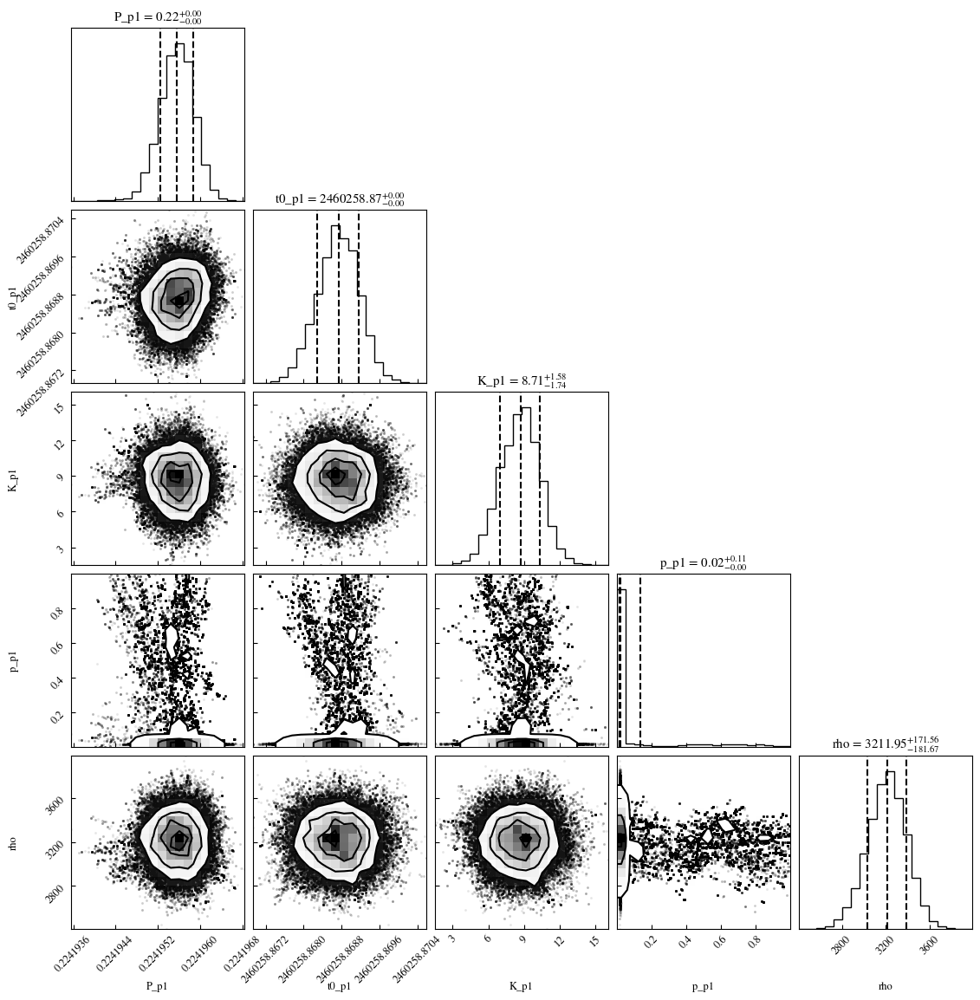

In [145]:
#We can define an array to store the parameters we want to plot on the corner plot.
corner_plot_params = np.vstack([df_post["P_p1"],
                                df_post["t0_p1"],
                                df_post["K_p1"],
                                df_post["p_p1"],
                                df_post["rho"]]).T

#We define the labels of the parameters.
corner_plot_labels = ["P_p1", "t0_p1", "K_p1", "p_p1", "rho"]

#We then plot the corner plot and the median.
corner.corner(corner_plot_params, labels=corner_plot_labels,
              quantiles = [0.16, 0.5, 0.84], show_titles=True)

plt.savefig("cornerplot_fco_ExoMUSE.png", dpi = 500)

plt.show();